### Visualization analysis for MDH likely-wood-857 sequences with the GPT-2 model
### Using sklearn's version of t-SNE and UMAP

In [1]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from typing import List, Dict

In [2]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

# 1&2. Get t-SNE and UMAP plots using sklearn

In [3]:
def run_tsne_sklearn(embed_data: np.ndarray) -> np.ndarray:
    from sklearn.manifold import TSNE
    model = TSNE(n_components=2, method="barnes_hut")
    data_proj = model.fit_transform(embed_data)
    return data_proj

In [4]:
def run_umap_sklearn(embed_data: np.ndarray) -> np.ndarray:
    from umap import UMAP
    model = UMAP(n_neighbors=30, min_dist=0.2, random_state=42)
    data_proj = model.fit_transform(embed_data)
    return data_proj

### Generated Sequences

In [5]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_gen.png")

In [6]:
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)

In [7]:
# t-SNE
gen_tsne_data_proj = run_tsne_sklearn(embed_data=embed_avg)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_gen.png


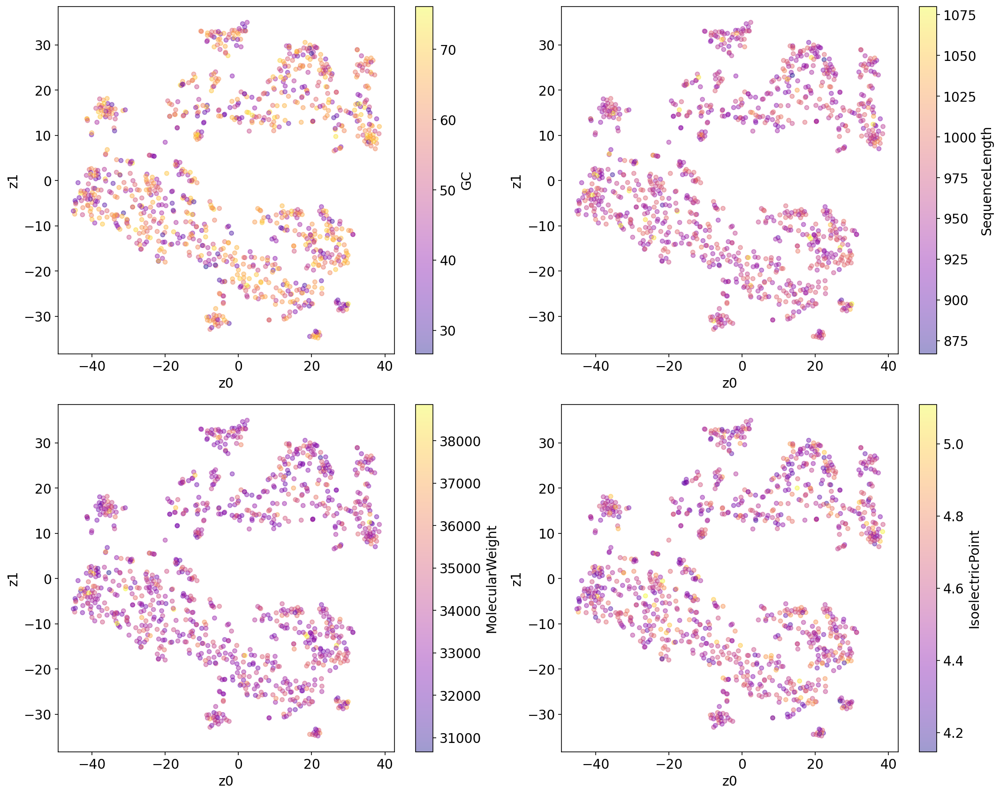

In [8]:
gen_tsne_results = visualize.plot_cluster_subplots(data_proj=gen_tsne_data_proj, 
                                                   paint_df=gen_paint_df, 
                                                   save_path=save_path)

In [9]:
# UMAP
gen_umap_data_proj = run_umap_sklearn(embed_data=embed_avg)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_gen.png


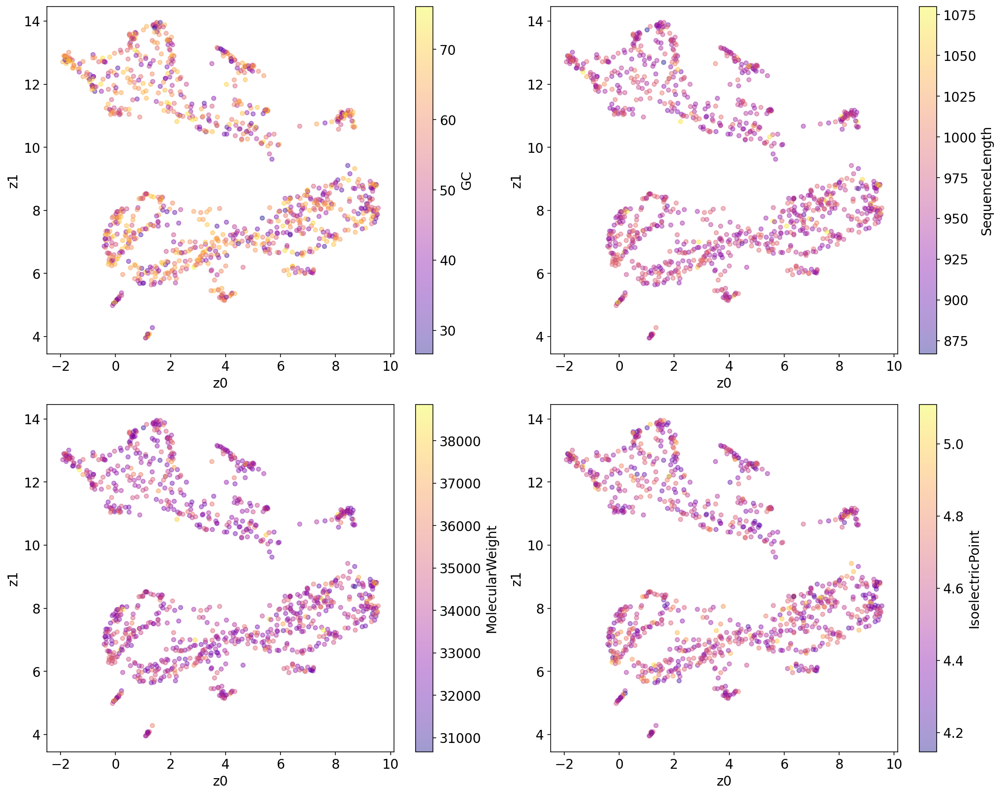

In [10]:
gen_umap_results = visualize.plot_cluster_subplots(data_proj=gen_umap_data_proj, 
                                                   paint_df=gen_paint_df, 
                                                   save_path=save_path)

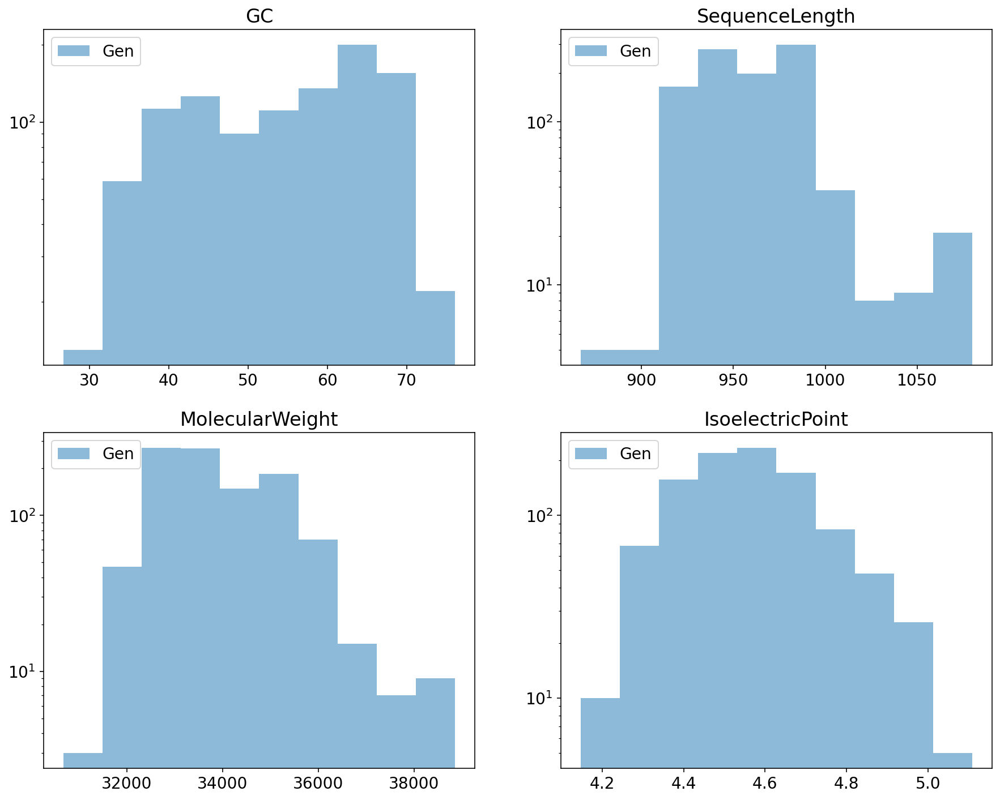

In [11]:
labels = ["Gen"]
paint_dfs = [gen_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

### Test Sequences

In [12]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_test.png")

In [13]:
embed_avg = np.load(test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_test.png


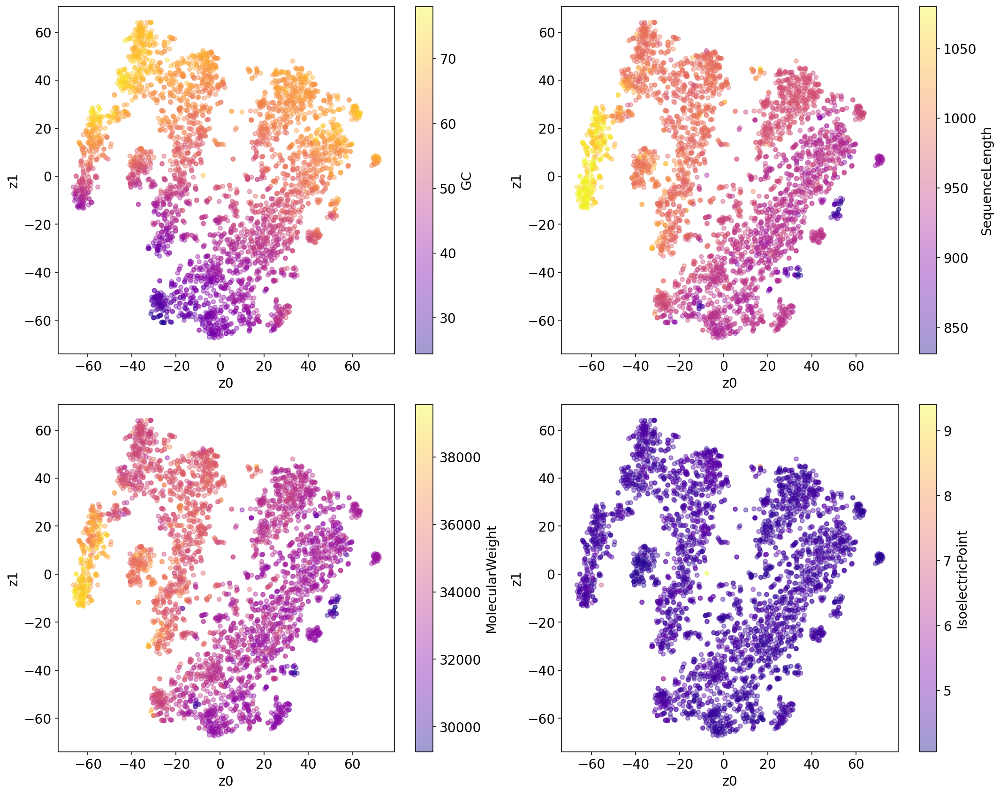

In [14]:
# t-SNE
test_tsne_data_proj = run_tsne_sklearn(embed_data=embed_avg)
test_tsne_results = visualize.plot_cluster_subplots(data_proj=test_tsne_data_proj, 
                                                   paint_df=test_paint_df, 
                                                   save_path=save_path)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_test.png


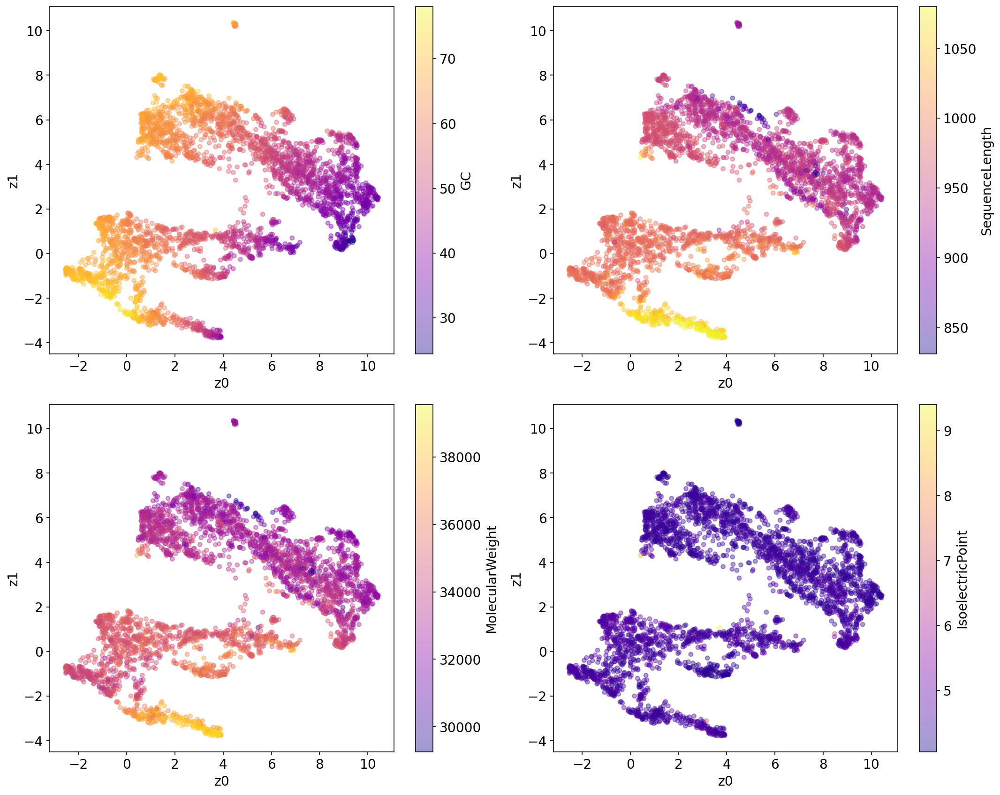

In [15]:
# UMAP
test_umap_data_proj = run_umap_sklearn(embed_data=embed_avg)
test_umap_results = visualize.plot_cluster_subplots(data_proj=test_umap_data_proj, 
                                                   paint_df=test_paint_df, 
                                                   save_path=save_path)

### Validation Sequences

In [16]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_val.png")

In [17]:
embed_avg = np.load(val_embed_path)
val_paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_val.png


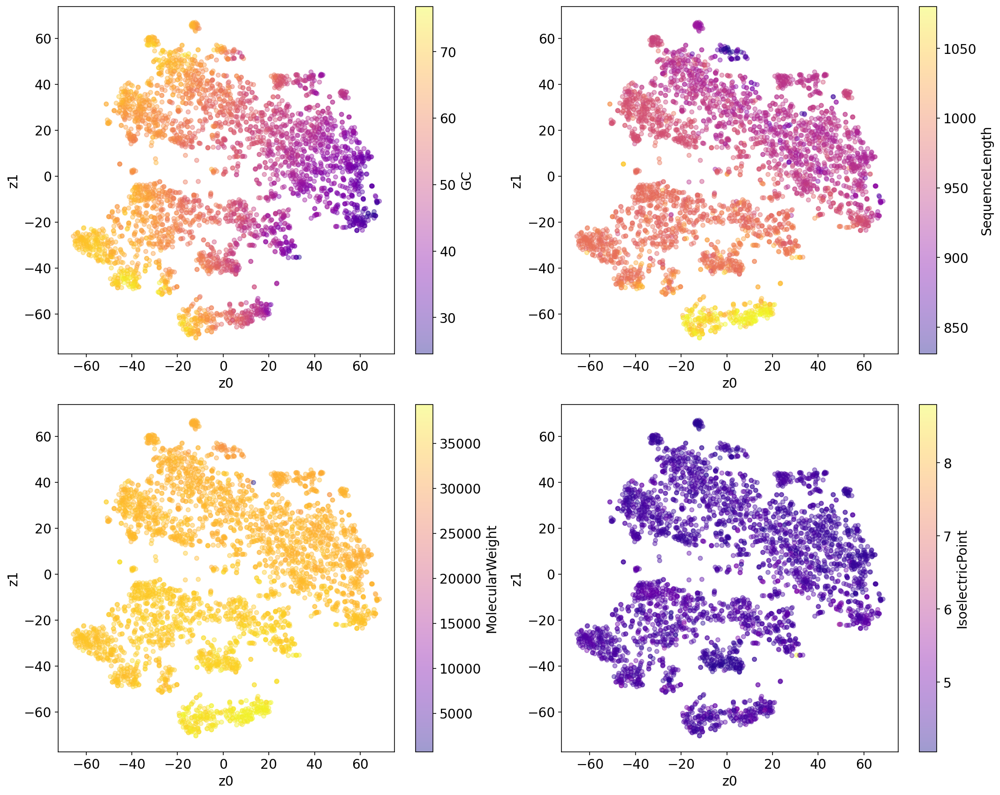

In [18]:
# t-SNE
val_tsne_data_proj = run_tsne_sklearn(embed_data=embed_avg)
val_tsne_results = visualize.plot_cluster_subplots(data_proj=val_tsne_data_proj, 
                                                   paint_df=val_paint_df, 
                                                   save_path=save_path)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_val.png


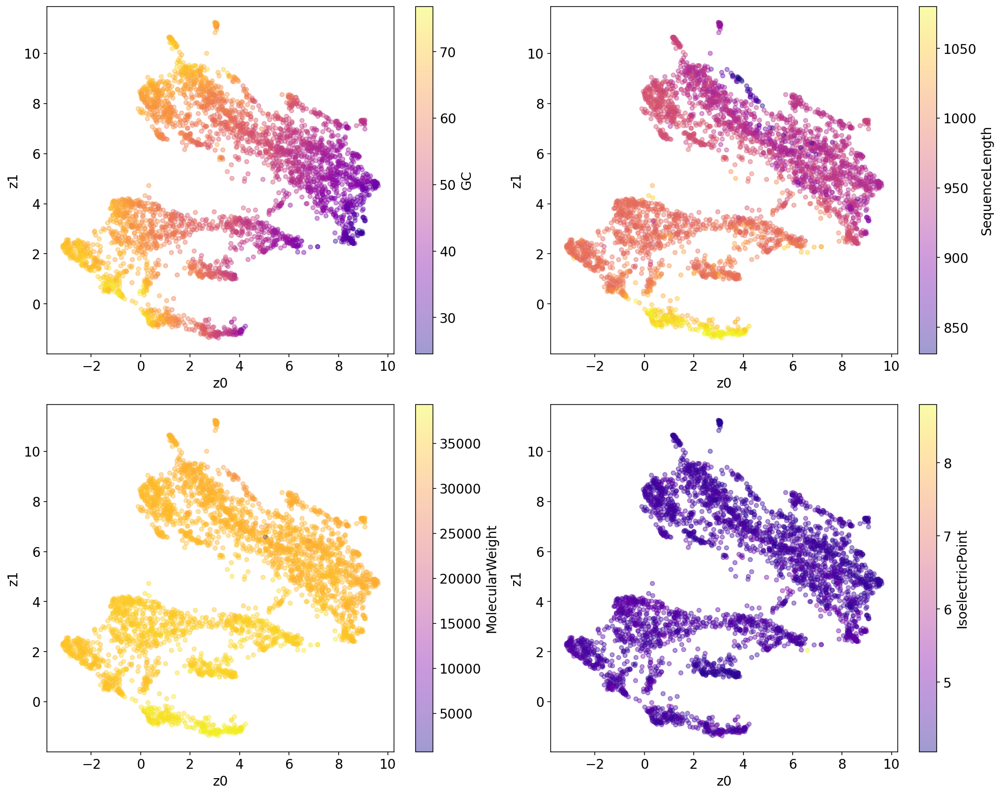

In [19]:
# UMAP
val_umap_data_proj = run_umap_sklearn(embed_data=embed_avg)
val_umap_results = visualize.plot_cluster_subplots(data_proj=val_umap_data_proj, 
                                                   paint_df=val_paint_df, 
                                                   save_path=save_path)

### Train Sequences

In [20]:
train_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-train_fasta_embeddings_mean.npy")
train_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/train_folder_concatenated.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/umap_train.png")

In [21]:
embed_avg = np.load(train_embed_path)
train_paint_df = visualize.get_paint_df(fasta_path=train_fasta_path, embed_path=train_embed_path)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:805: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_train.png


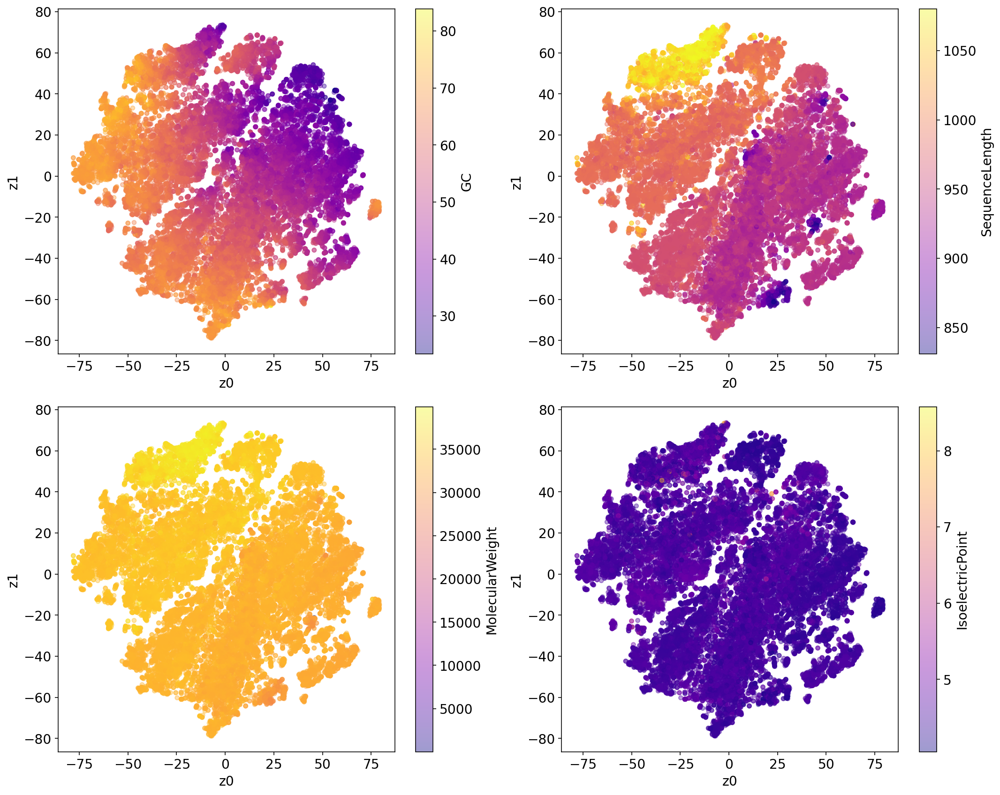

In [22]:
# t-SNE
train_tsne_data_proj = run_tsne_sklearn(embed_data=embed_avg)
train_tsne_results = visualize.plot_cluster_subplots(data_proj=train_tsne_data_proj, 
                                                   paint_df=train_paint_df, 
                                                   save_path=save_path)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/umap_train.png


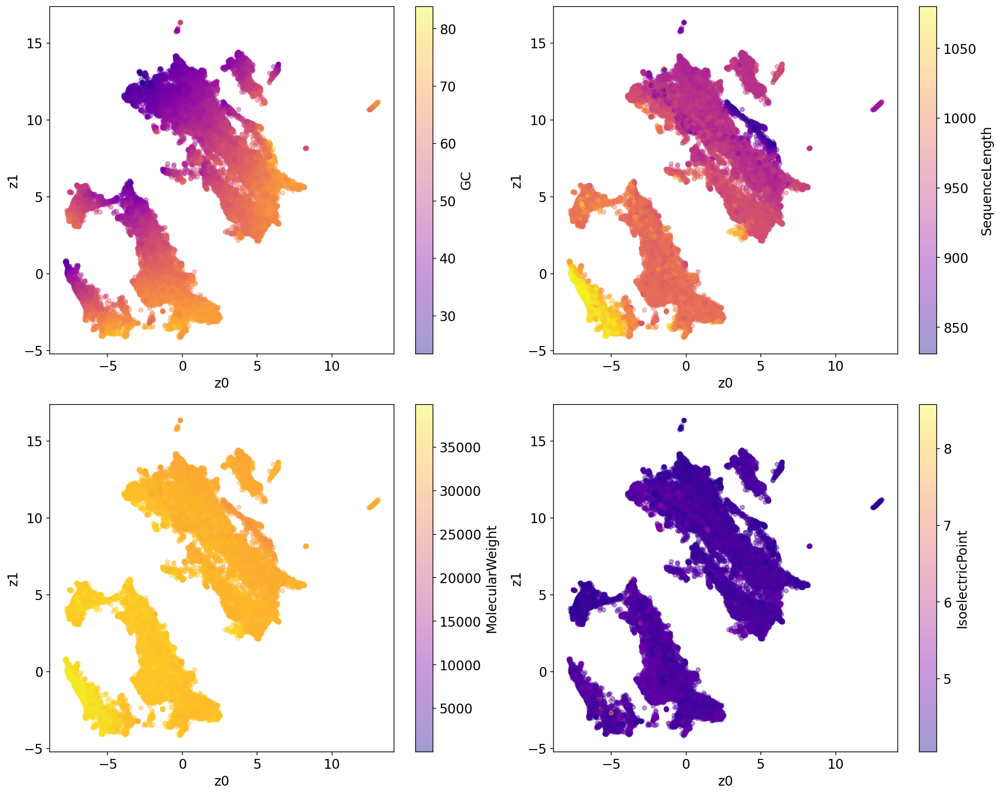

In [23]:
# UMAP
train_umap_data_proj = run_umap_sklearn(embed_data=embed_avg)
train_umap_results = visualize.plot_cluster_subplots(data_proj=train_umap_data_proj, 
                                                   paint_df=train_paint_df, 
                                                   save_path=save_path)